Deep AR implementaton on Electrcity load estimation for 369 house holds

In [ ]:
pip install mxnet-cu102 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install "gluonts[mxnet]"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# import all necessary libraries
import mxnet as mx
from mxnet import gluon
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
from gluonts.mx.model.deepar import DeepAREstimator
from gluonts.mx.model.n_beats import NBEATSEstimator
from gluonts.mx.trainer import Trainer
import numpy as np
import matplotlib as mb
from gluonts.dataset.repository.datasets import get_dataset, dataset_recipes
from gluonts.dataset.util import to_pandas
from gluonts.evaluation.backtest import make_evaluation_predictions
from gluonts.dataset.common import ListDataset
from gluonts.dataset.field_names import FieldName
from tqdm.autonotebook import tqdm
from gluonts.evaluation import Evaluator

<ipython-input-28-5a8f482e0d5a>:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [ ]:
# source of dataset electricity consumption of 370 houses from uci

!wget https://archive.ics.uci.edu/ml/machine-learning-databases/00321/LD2011_2014.txt.zip

--2023-04-04 15:55:48--  https://archive.ics.uci.edu/ml/machine-learning-databases/00321/LD2011_2014.txt.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 261335609 (249M) [application/x-httpd-php]
Saving to: ‘LD2011_2014.txt.zip.2’

LD2011_2014.txt.zip 100%[===================>] 249.23M  41.5MB/s    in 6.4s    

2023-04-04 15:55:55 (38.9 MB/s) - ‘LD2011_2014.txt.zip.2’ saved [261335609/261335609]



In [ ]:
#unzip the data from soucrece
!unzip LD2011_2014.txt.zip

Archive:  LD2011_2014.txt.zip
replace LD2011_2014.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: LD2011_2014.txt         y
y
y





replace __MACOSX/._LD2011_2014.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename:   inflating: __MACOSX/._LD2011_2014.txt  


In [ ]:
#Display sample records
!head LD2011_2014.txt

"";"MT_001";"MT_002";"MT_003";"MT_004";"MT_005";"MT_006";"MT_007";"MT_008";"MT_009";"MT_010";"MT_011";"MT_012";"MT_013";"MT_014";"MT_015";"MT_016";"MT_017";"MT_018";"MT_019";"MT_020";"MT_021";"MT_022";"MT_023";"MT_024";"MT_025";"MT_026";"MT_027";"MT_028";"MT_029";"MT_030";"MT_031";"MT_032";"MT_033";"MT_034";"MT_035";"MT_036";"MT_037";"MT_038";"MT_039";"MT_040";"MT_041";"MT_042";"MT_043";"MT_044";"MT_045";"MT_046";"MT_047";"MT_048";"MT_049";"MT_050";"MT_051";"MT_052";"MT_053";"MT_054";"MT_055";"MT_056";"MT_057";"MT_058";"MT_059";"MT_060";"MT_061";"MT_062";"MT_063";"MT_064";"MT_065";"MT_066";"MT_067";"MT_068";"MT_069";"MT_070";"MT_071";"MT_072";"MT_073";"MT_074";"MT_075";"MT_076";"MT_077";"MT_078";"MT_079";"MT_080";"MT_081";"MT_082";"MT_083";"MT_084";"MT_085";"MT_086";"MT_087";"MT_088";"MT_089";"MT_090";"MT_091";"MT_092";"MT_093";"MT_094";"MT_095";"MT_096";"MT_097";"MT_098";"MT_099";"MT_100";"MT_101";"MT_102";"MT_103";"MT_104";"MT_105";"MT_106";"MT_107";"MT_108";"MT_109";"MT_110";"MT_111

In [ ]:
# In order to process the data loaded it in to a data frame
load_data_frame=pd.read_csv("LD2011_2014.txt",delimiter=";",index_col=0,parse_dates=True,decimal=",")

In [ ]:
#Display the loaded data frame
load_data_frame

,MT_001,MT_002,MT_003,MT_004,MT_005,MT_006,MT_007,MT_008,MT_009,MT_010,...,MT_361,MT_362,MT_363,MT_364,MT_365,MT_366,MT_367,MT_368,MT_369,MT_370
2011-01-01 00:15:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2011-01-01 00:30:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2011-01-01 00:45:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2011-01-01 01:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2011-01-01 01:15:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-31 23:00:00,2.538071,22.048364,1.737619,150.406504,85.365854,303.571429,11.305822,282.828283,68.181818,72.043011,...,276.945039,28200.0,1616.033755,1363.636364,29.986962,5.851375,697.102722,176.961603,651.026393,7621.621622
2014-12-31 23:15:00,2.538071,21.337127,1.737619,166.666667,81.707317,324.404762,11.305822,252.525253,64.685315,72.043011,...,279.800143,28300.0,1569.620253,1340.909091,29.986962,9.947338,671.641791,168.614357,669.354839,6702.702703
2014-12-31 23:30:00,2.538071,20.625889,1.737619,162.601626,82.926829,318.452381,10.175240,242.424242,61.188811,74.193548,...,284.796574,27800.0,1556.962025,1318.181818,27.379400,9.362200,670.763828,153.589316,670.087977,6864.864865
2014-12-31 23:45:00,1.269036,21.337127,1.737619,166.666667,85.365854,285.714286,10.175240,225.589226,64.685315,72.043011,...,246.252677,28000.0,1443.037975,909.090909,26.075619,4.095963,664.618086,146.911519,646.627566,6540.540541


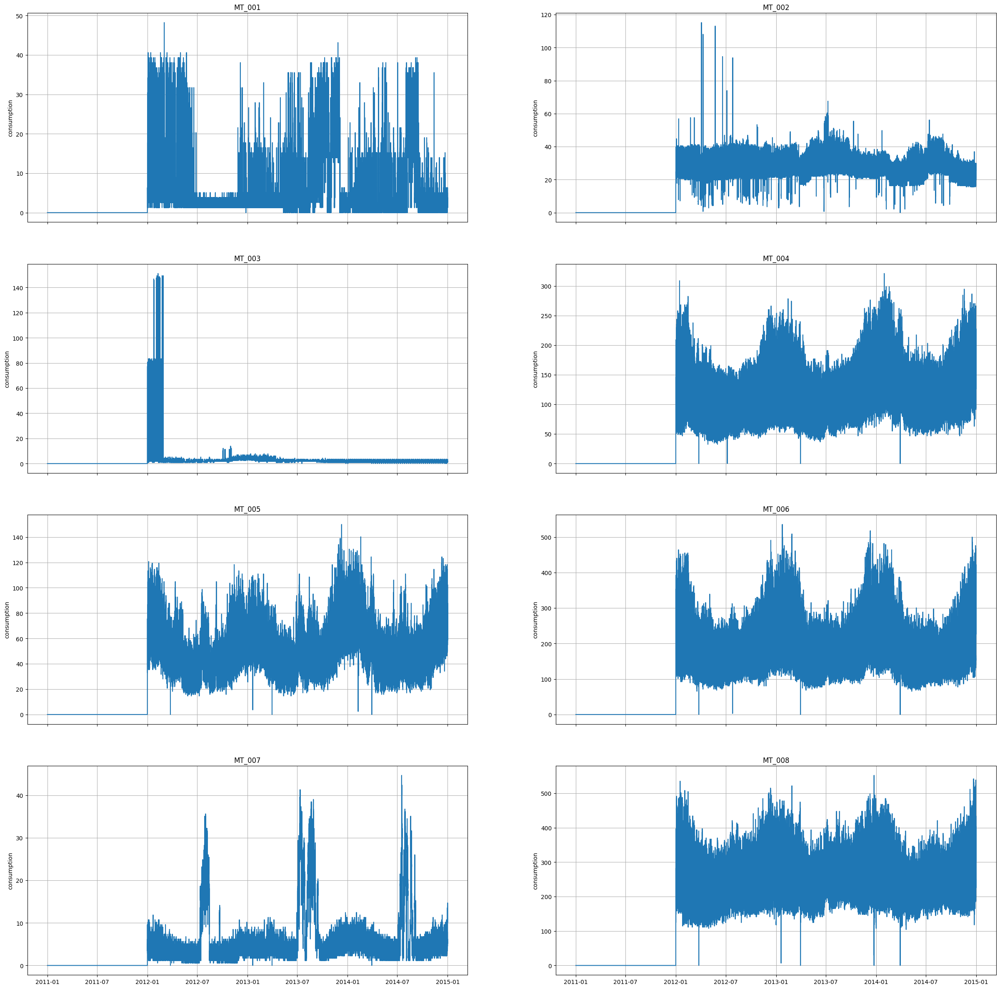

In [ ]:
#plots of sample data for a custom range of 0 to 8 time series
plt.rcParams["axes.grid"] = True
fig,ax=plt.subplots(nrows=4,ncols=2,figsize=(30,30),sharex=True)
axes_array=ax.ravel()
for i in range(0,8):
    axes_array[i].plot(load_data_frame.iloc[1:,i])
    axes_array[i].set(title=load_data_frame.iloc[1:,i].name , ylabel="consumption")
    axes_array[i].grid(which='minor',axis='x')

In [ ]:
# Transposing the loaded data frame to have individual housholds as rows with time frequency as columns for modeeling purposes in gluonTS
load_data_frame_1=load_data_frame.reset_index(drop=True).T.reset_index()
load_data_frame_1

,index,0,1,2,3,4,5,6,7,8,...,140246,140247,140248,140249,140250,140251,140252,140253,140254,140255
0,MT_001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.538071,1.269036,2.538071,2.538071,1.269036,2.538071,2.538071,2.538071,1.269036,2.538071
1,MT_002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,22.048364,22.048364,22.048364,22.048364,22.048364,22.048364,21.337127,20.625889,21.337127,19.914651
2,MT_003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.737619,1.737619,1.737619,1.737619,1.737619,1.737619,1.737619,1.737619,1.737619,1.737619
3,MT_004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,156.504065,164.634146,160.569106,162.601626,156.504065,150.406504,166.666667,162.601626,166.666667,178.861789
4,MT_005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,86.585366,93.902439,87.804878,80.487805,85.365854,85.365854,81.707317,82.926829,85.365854,84.146341
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
365,MT_366,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.510825,6.436513,11.702750,8.191925,4.681100,5.851375,9.947338,9.362200,4.095963,4.095963
366,MT_367,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,546.971027,521.510097,672.519754,719.051800,707.638279,697.102722,671.641791,670.763828,664.618086,628.621598
367,MT_368,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,185.308848,173.622705,213.689482,205.342237,188.647746,176.961603,168.614357,153.589316,146.911519,131.886477
368,MT_369,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,653.958944,658.357771,711.876833,694.281525,652.492669,651.026393,669.354839,670.087977,646.627566,673.020528


In [ ]:
#Shape of the transposed dataframe
load_data_frame_1.shape

(370, 140257)

In [ ]:
# In order to utilise house hold id's as feature static variable in GluonTS theses column was converted to codes for categorical feature processing.
House_codes=load_data_frame_1["index"].astype('category').cat.codes.values
House_codes

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [ ]:
#split the data feame into test and train sets
electric_train=load_data_frame_1.iloc[:,1:138912].values
electric_test=load_data_frame_1.iloc[:,138912:].values

In [ ]:
electric_train.shape

(370, 138911)

In [ ]:
electric_test.shape

(370, 1345)

In [ ]:
# Initilise the variables for deep ar estimator
freq="15min"
start_train = pd.Timestamp("2011-01-01 00:15:00", freq=freq)
start_test = pd.Timestamp("2014-12-18 00:15:00", freq=freq)
prediction_length=96

<ipython-input-41-22411dfd5e01>:3: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  start_train = pd.Timestamp("2011-01-01 00:15:00", freq=freq)
<ipython-input-41-22411dfd5e01>:4: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  start_test = pd.Timestamp("2014-12-18 00:15:00", freq=freq)


In [ ]:
estimator = DeepAREstimator(freq=freq, 
                            context_length=672,
                            prediction_length=prediction_length,
                            use_feat_static_cat=True,
                            cardinality=[1],
                            num_layers=2,
                            num_cells=40,
                            cell_type='lstm',
                            trainer=Trainer(epochs=50, learning_rate=0.001))

In [ ]:
# Convert the data into gluonts list dataset form to input the model
train_ds = ListDataset([
    {
        FieldName.TARGET: target,
        FieldName.START: start_train,
        FieldName.FEAT_STATIC_CAT: fsc
    }
    for (target, fsc) in zip(electric_train[0:369],
                             House_codes[0:369].reshape(-1,1))
], freq=freq)

test_ds = ListDataset([
    {
        FieldName.TARGET: target,
        FieldName.START: start_test,
        FieldName.FEAT_STATIC_CAT: fsc
    }
    for (target, fsc) in zip(electric_test[0:369],
                            House_codes[0:369].reshape(-1,1))
], freq=freq)

In [ ]:
# train the estimator
predictor = estimator.train(training_data=train_ds)

100%|██████████| 50/50 [03:33<00:00,  4.26s/it, epoch=50/50, avg_epoch_loss=3.75]


In [ ]:
# Generation of predictions
forecast_it, ts_it = make_evaluation_predictions(
    dataset=test_ds,  
    predictor=predictor,  
    num_samples=100, # sampling to draw from gaussian likelihood function
)

In [ ]:
# Conversion of predictions to a list
print("Obtaining time series conditioning values ...")
tss = list(tqdm(ts_it, total=len(electric_test)))
print("Obtaining time series predictions ...")
forecasts = list(tqdm(forecast_it, total=len(electric_test)))

Obtaining time series conditioning values ...


  0%|          | 0/370 [00:00<?, ?it/s]

Obtaining time series predictions ...


  0%|          | 0/370 [00:00<?, ?it/s]

In [ ]:
#sample forecast
forecast_entry = forecasts[1]
type(forecast_entry)

gluonts.model.forecast.SampleForecast

In [ ]:
# plot the predictions with probabilistic ranges ( provided in the official documentation of gluonTS )
def plot_prob_forecasts(ts_entry, forecast_entry):
    plot_length = prediction_length
    prediction_intervals = (80.0, 95.0)
    legend = ["observations", "median prediction"] + [f"{k}% prediction interval" for k in prediction_intervals][::-1]

    fig, ax = plt.subplots(1, 1, figsize=(10, 7))
    ts_entry[-plot_length:].plot(ax=ax)  
    forecast_entry.plot(prediction_intervals=prediction_intervals, color='g')
    plt.grid(which="both")
    plt.legend(legend, loc="upper left")
    plt.show()

  0%|          | 0/39 [00:00<?, ?it/s]

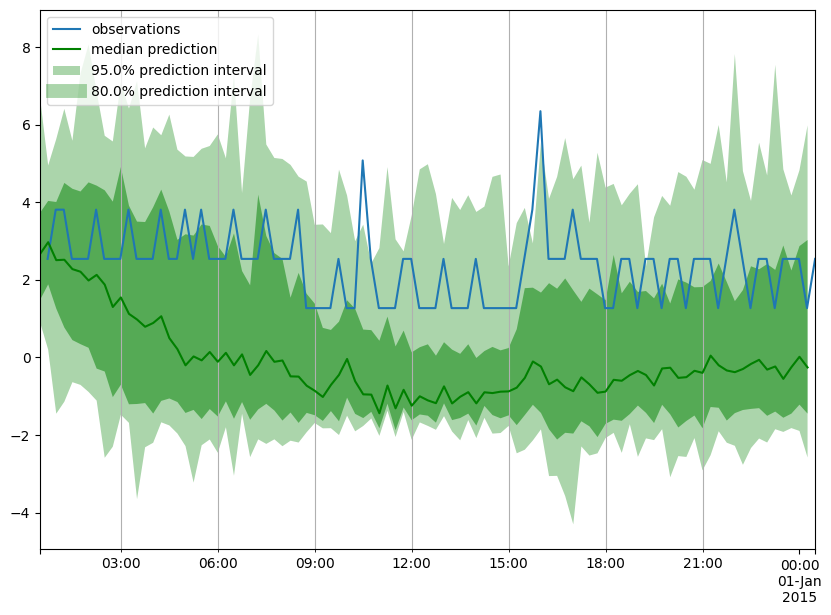

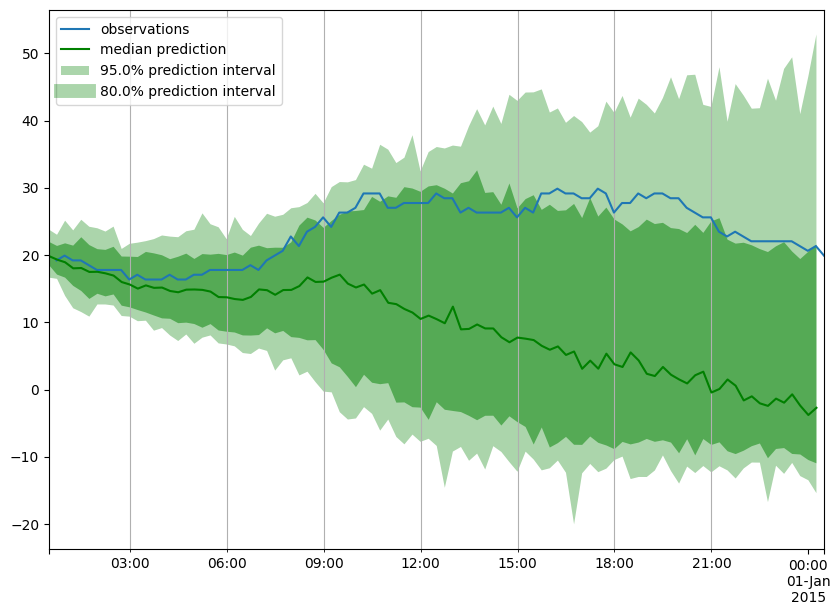

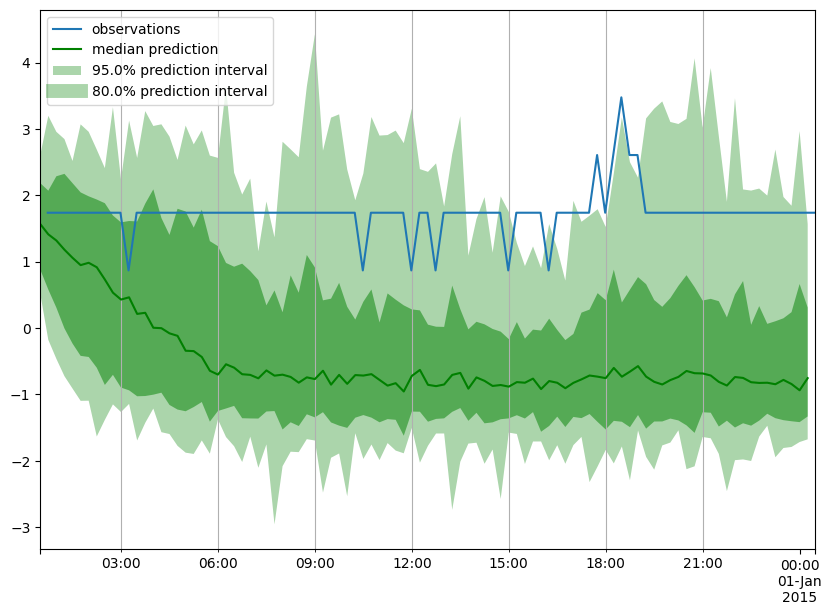

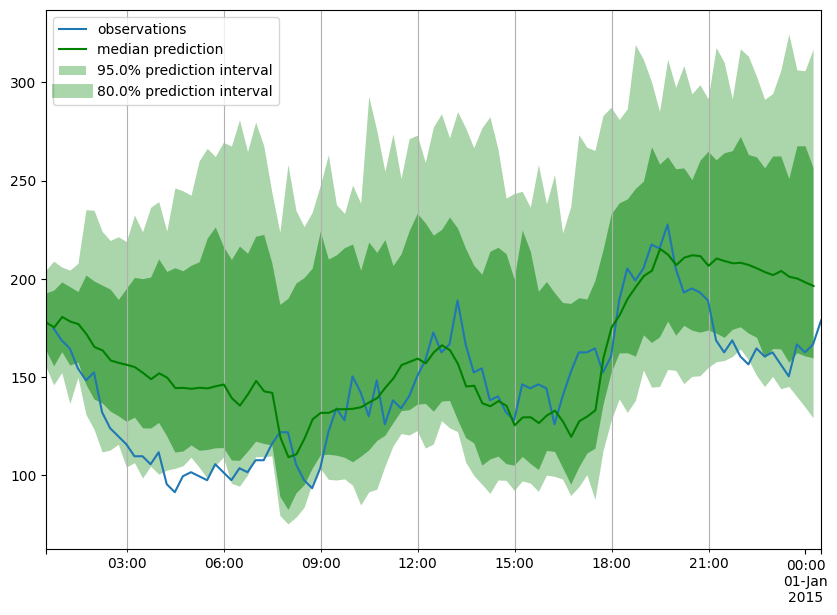

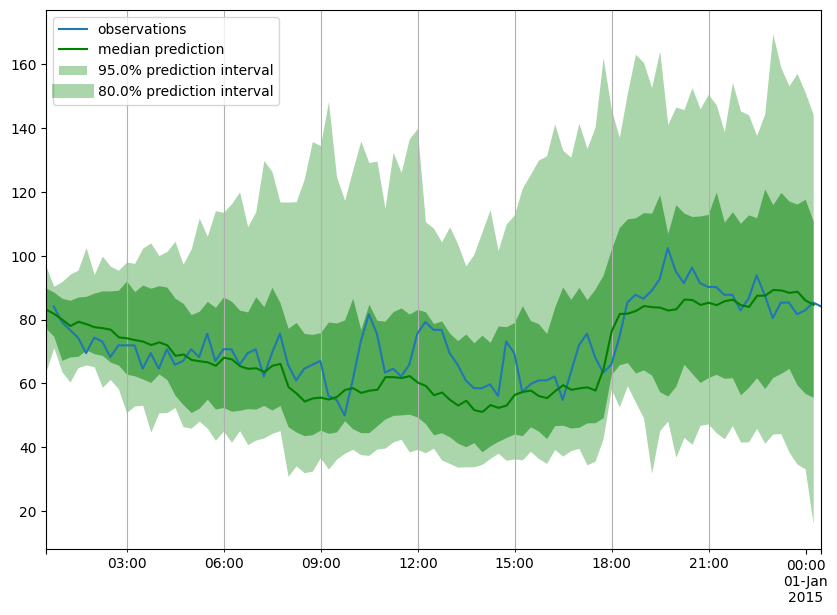

...

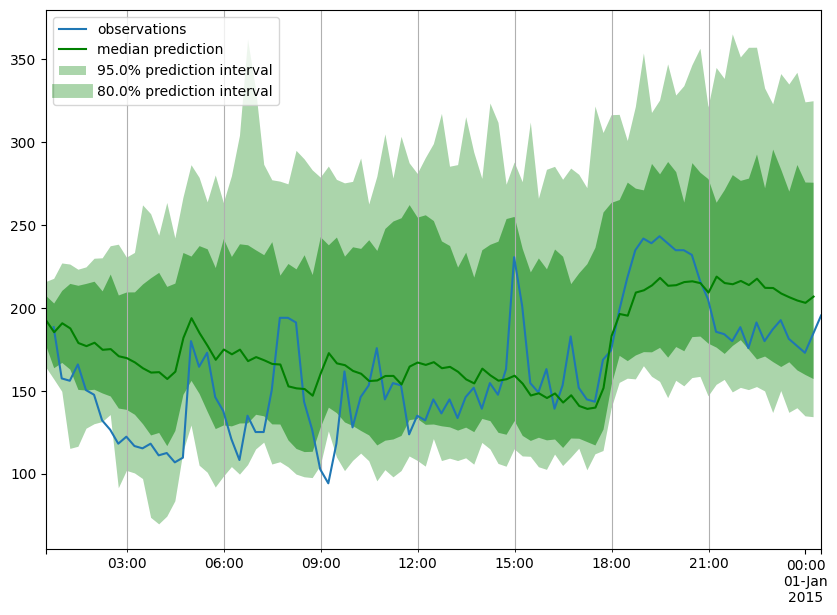

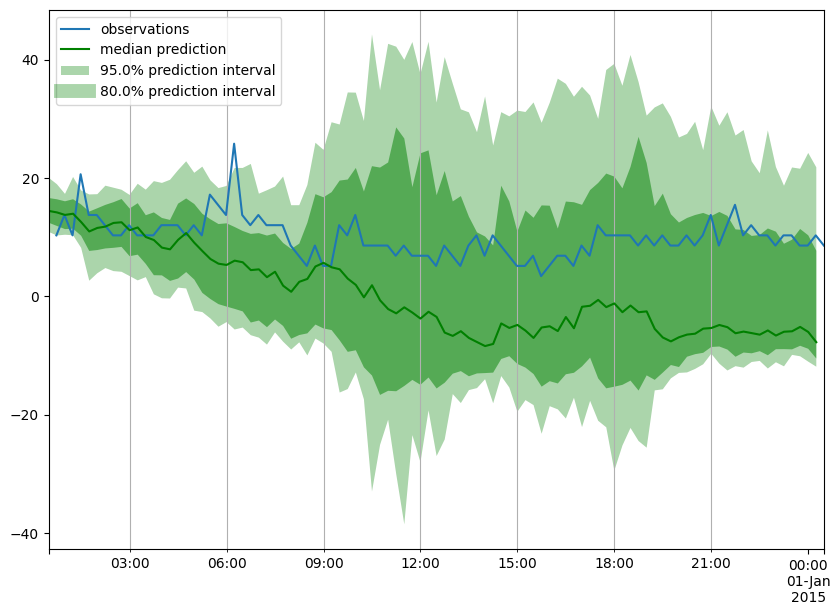

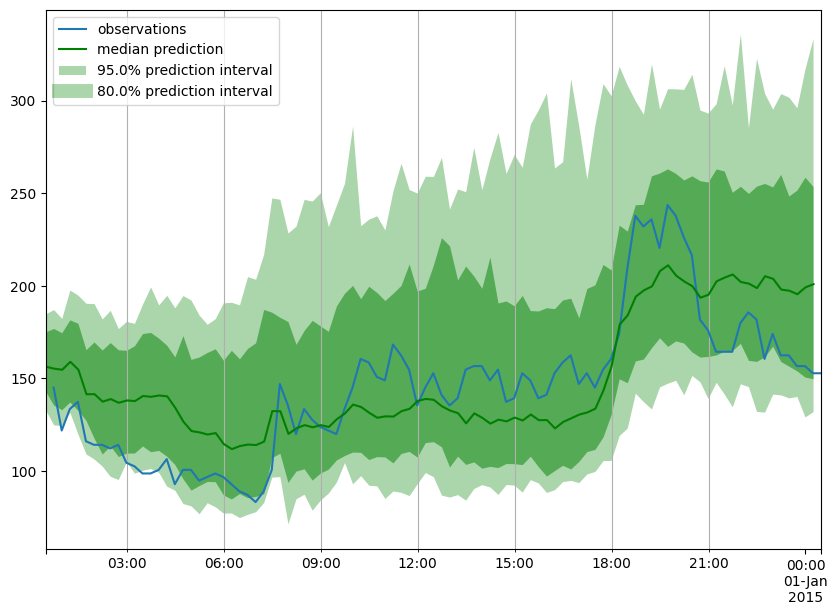

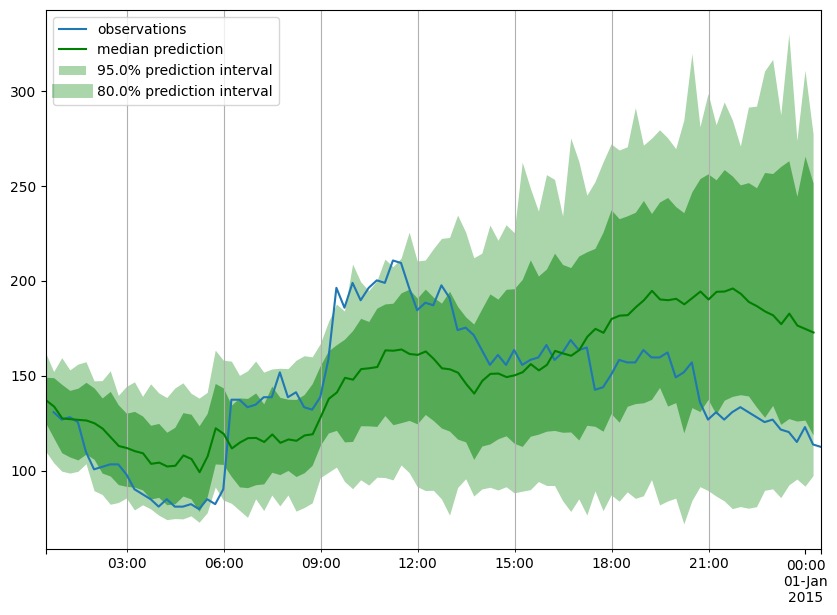

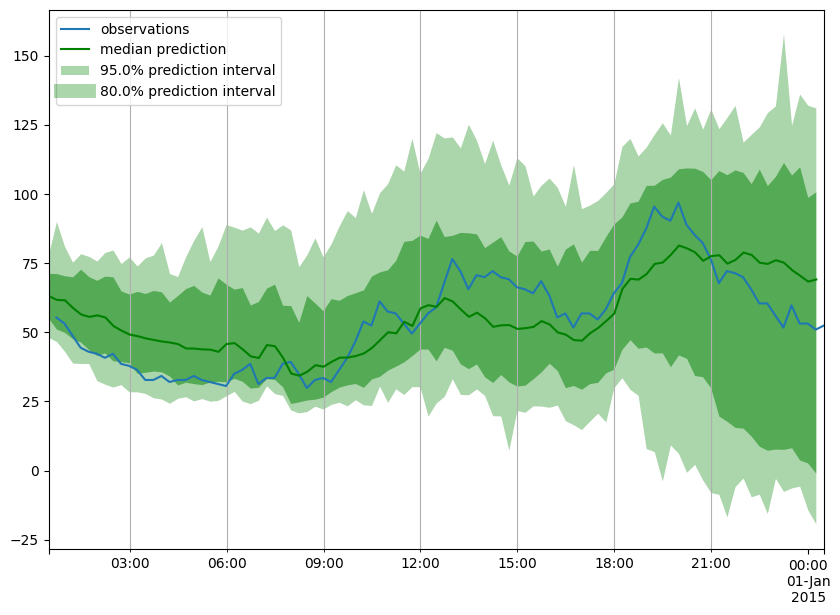

In [ ]:
# plot the predictions for certain range of households from predictions
for i in tqdm(range(39)):
    ts_entry = tss[i] 
    forecast_entry = forecasts[i]
    plot_prob_forecasts(ts_entry, forecast_entry)

  0%|          | 0/40 [00:00<?, ?it/s]

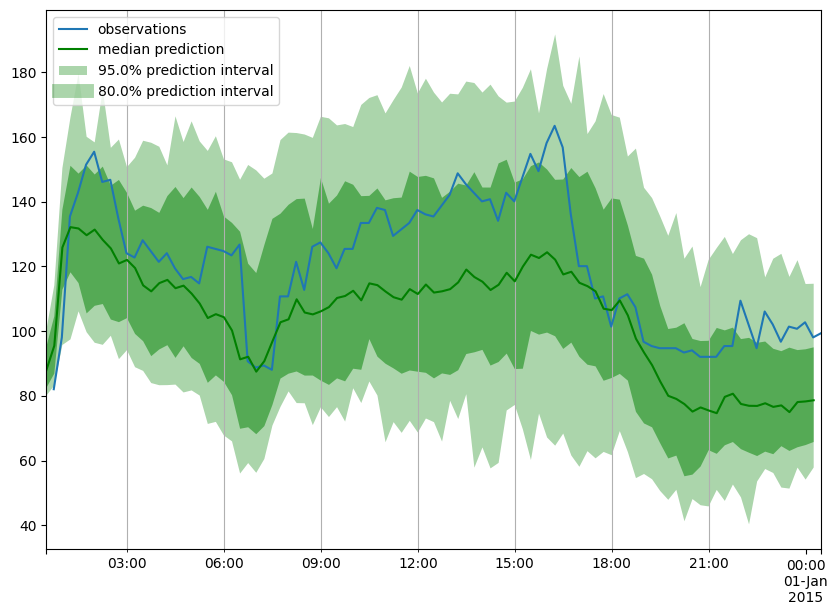

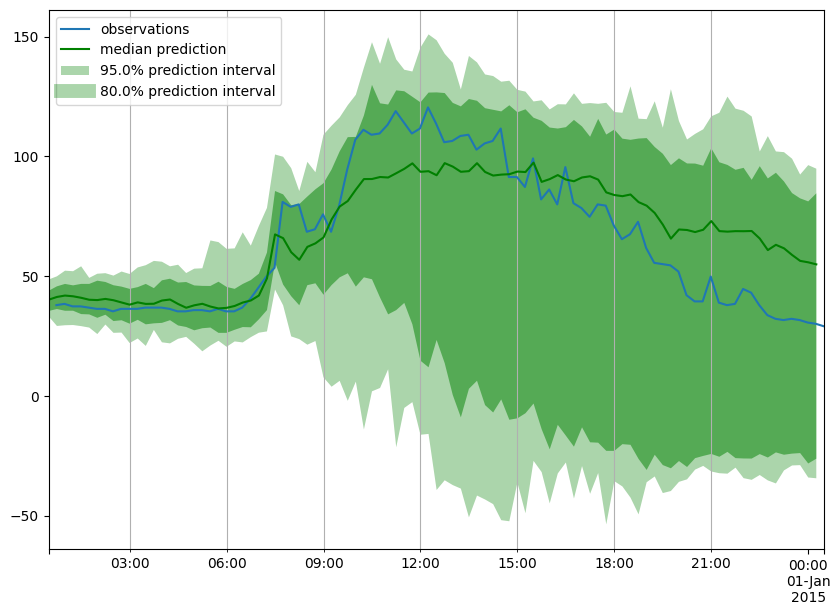

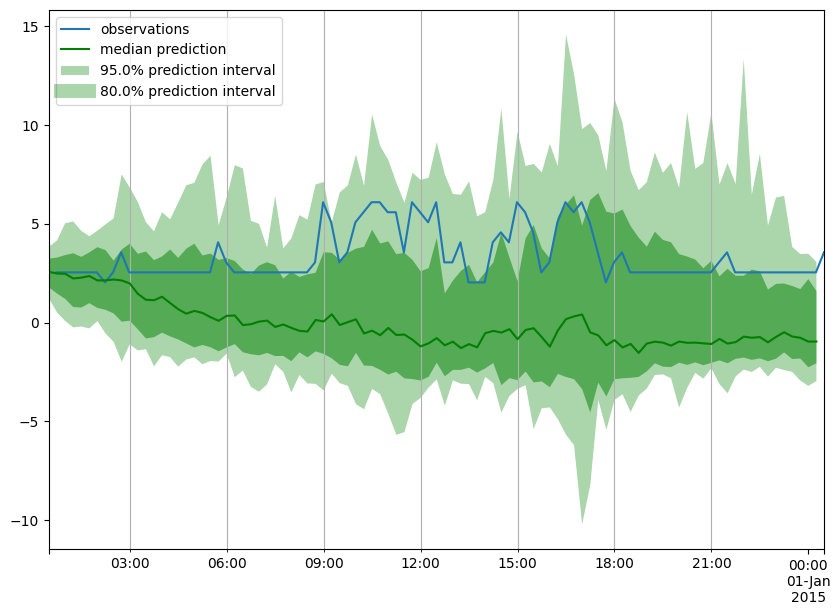

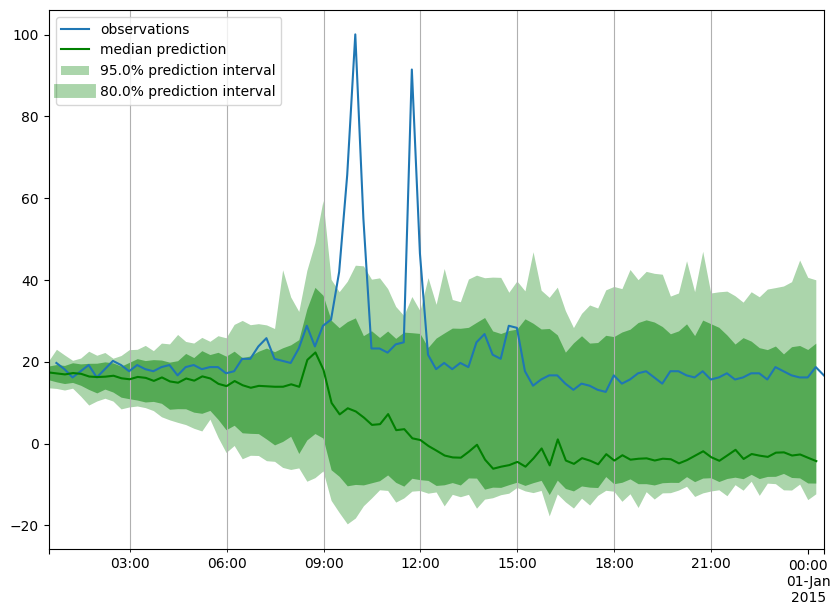

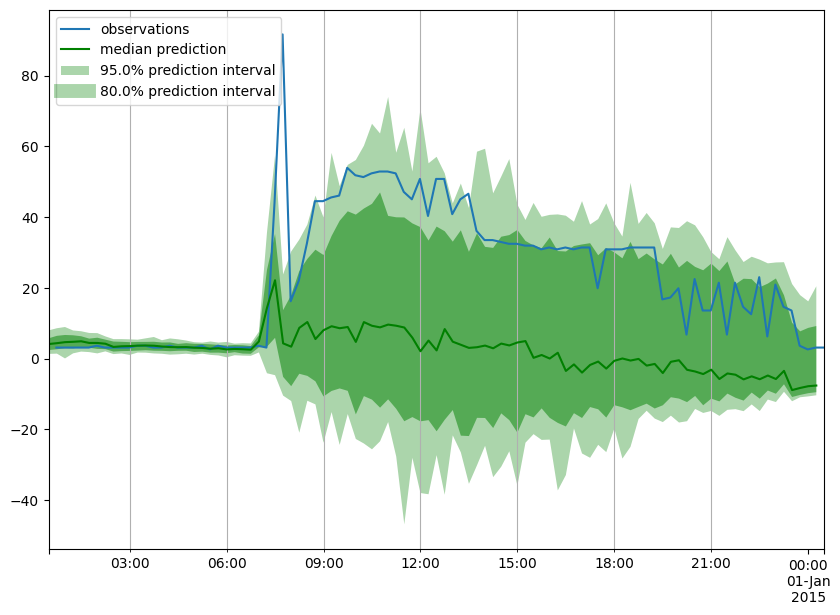

...

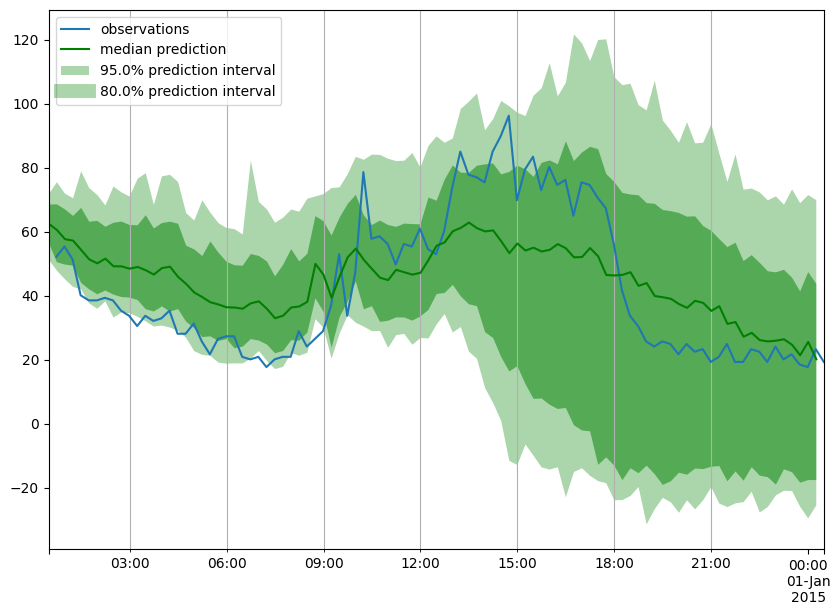

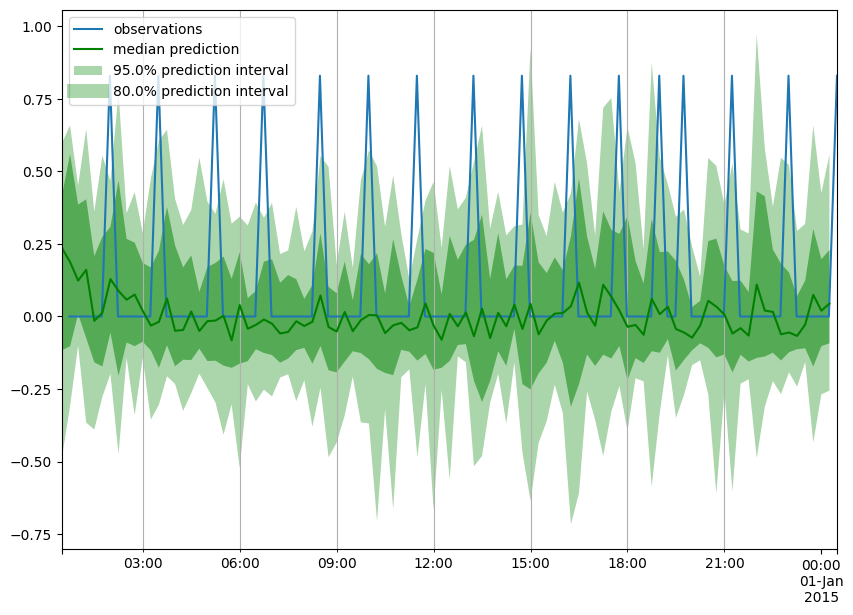

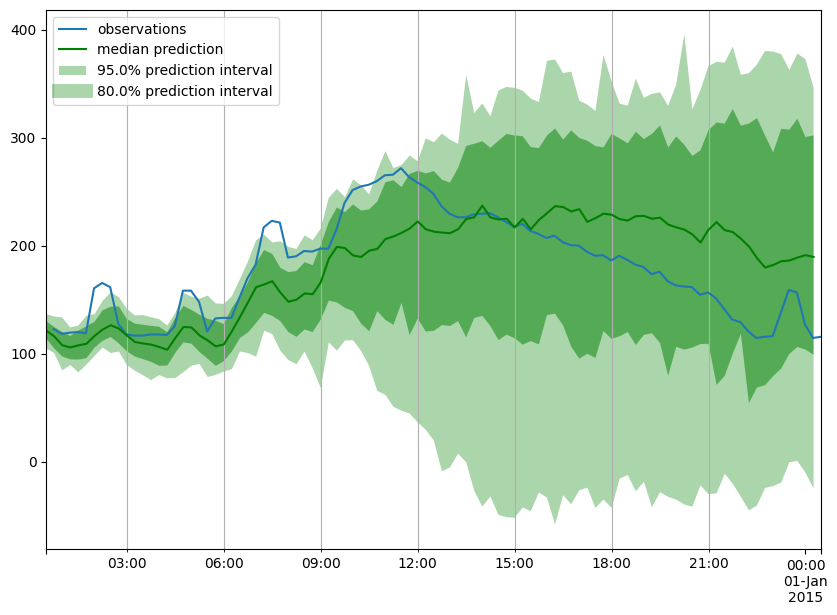

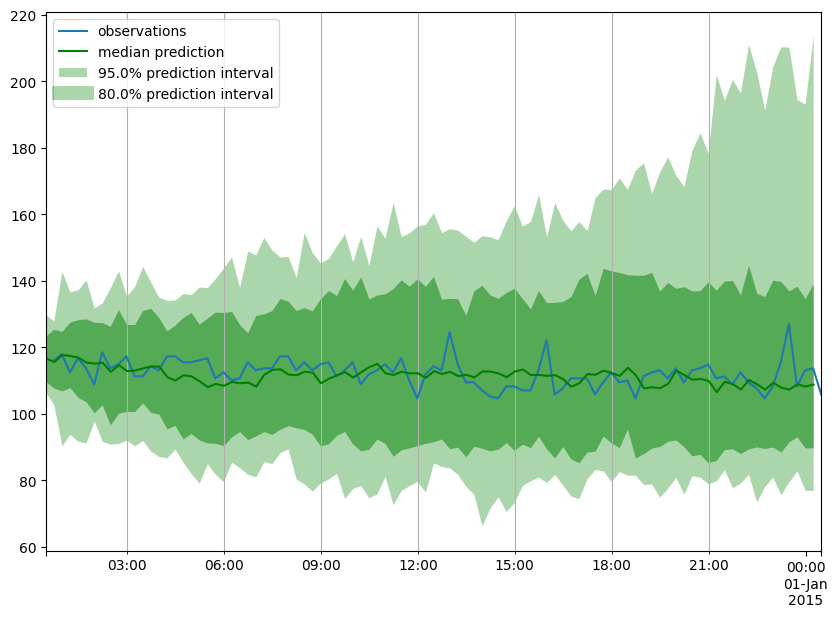

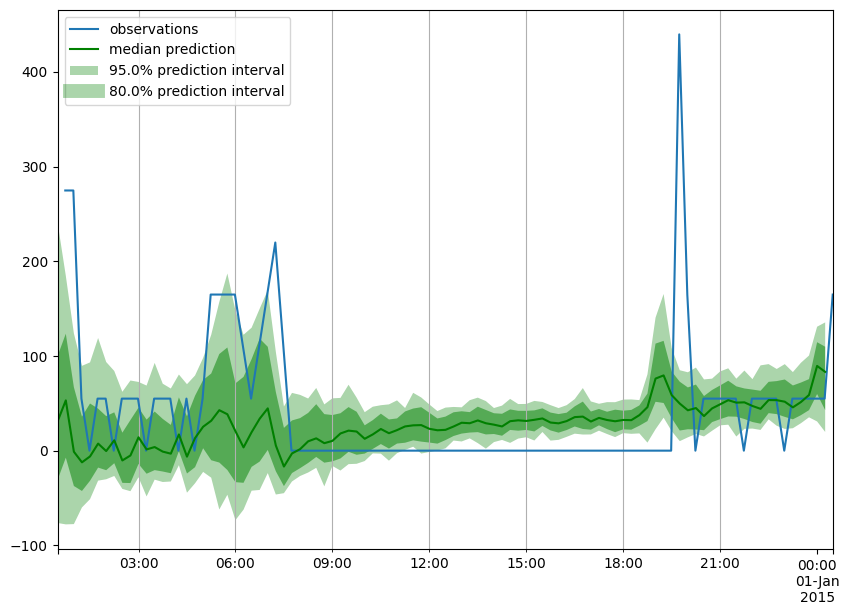

In [ ]:
# plot the predictions for certain range of households from predictions
for i in tqdm(range(90,130)):
    ts_entry = tss[i] 
    forecast_entry = forecasts[i]
    plot_prob_forecasts(ts_entry, forecast_entry)

In [ ]:
#Utilise default library from gluonTS for evaluating the perfromance of the model
evaluator = Evaluator()
agg_metrics, item_metrics = evaluator(iter(tss), iter(forecasts), num_series=len(electric_test[0:369]))

Running evaluation: 100%|██████████| 369/369 [00:00<00:00, 3146.12it/s]
/usr/local/lib/python3.9/dist-packages/pandas/core/dtypes/cast.py:1181: UserWarning: Warning: converting a masked element to nan.
  return arr.astype(dtype, copy=True)


In [ ]:
item_metrics

,item_id,forecast_start,MSE,abs_error,abs_target_sum,abs_target_mean,seasonal_error,MASE,MAPE,sMAPE,...,QuantileLoss[0.6],Coverage[0.6],QuantileLoss[0.7],Coverage[0.7],QuantileLoss[0.8],Coverage[0.8],QuantileLoss[0.9],Coverage[0.9],RMSE,NRMSE
0,None,2014-12-31 00:30,5.776649,242.293610,229.695419,2.392661,0.990574,2.547908,1.150768,1.735362,...,262.562769,0.020833,261.832161,0.062500,224.412180,0.135417,118.407282,0.437500,2.403466,1.004516
1,None,2014-12-31 00:30,208.765645,1367.528687,2272.404053,23.670876,1.292935,11.017640,0.560769,0.919217,...,1322.103452,0.052083,1036.088877,0.135417,638.033447,0.218750,171.105320,0.562500,14.448725,0.610401
2,None,2014-12-31 00:30,4.610246,213.461304,166.811462,1.737619,0.472458,4.706358,1.295305,1.812522,...,239.340677,0.000000,252.987506,0.020833,244.177097,0.062500,185.559103,0.156250,2.147148,1.235684
3,None,2014-12-31 00:30,1078.336833,2302.964355,13993.902344,145.769816,19.891553,1.206000,0.183697,0.163851,...,2163.458246,0.750000,2030.649292,0.916667,1881.958496,0.968750,1443.680530,1.000000,32.838039,0.225273
4,None,2014-12-31 00:30,44.724711,616.240845,7018.292969,73.107218,9.386966,0.683839,0.087223,0.092631,...,582.125301,0.479167,514.841544,0.697917,438.311081,0.843750,361.118856,0.989583,6.687654,0.091477
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364,None,2014-12-31 00:30,1950.507487,3318.287109,7349.413086,76.556386,13.331811,2.592708,0.949939,0.513081,...,3069.089520,0.927083,2717.949777,0.958333,2169.245601,0.979167,1327.960751,0.989583,44.164550,0.576889
365,None,2014-12-31 00:30,36.551577,655.889526,526.623779,5.485664,7.831606,0.872386,1.313737,1.762364,...,693.060470,0.125000,655.325648,0.197917,487.740105,0.312500,290.214771,0.572917,6.045790,1.102107
366,None,2014-12-31 00:30,17821.567708,8709.286133,50119.406250,522.077148,97.597063,0.929554,0.207129,0.174001,...,8181.222461,0.979167,7535.404358,1.000000,6276.290637,1.000000,4408.326263,1.000000,133.497445,0.255704
367,None,2014-12-31 00:30,2295.092448,3423.787109,13148.580078,136.964376,63.412999,0.562415,0.446126,0.277394,...,3307.974243,0.906250,3077.988646,0.947917,2558.066342,0.947917,1654.988647,0.979167,47.907123,0.349778


In [ ]:
#Calculate RMSE Values
item_metrics['RMSE']=np.sqrt(item_metrics['MSE'])

In [ ]:
# Calculation of NRMSE for each predicted time series
item_metrics['NRMSE']=item_metrics['RMSE']/item_metrics['abs_target_mean']

In [ ]:
# number of time series with less than 0.4 nrmse
item_metrics[item_metrics['NRMSE']<0.4].count()

item_id                0
forecast_start       249
MSE                  249
abs_error            249
abs_target_sum       249
abs_target_mean      249
seasonal_error       249
MASE                 249
MAPE                 249
sMAPE                249
ND                   249
MSIS                 249
QuantileLoss[0.1]    249
Coverage[0.1]        249
QuantileLoss[0.2]    249
Coverage[0.2]        249
QuantileLoss[0.3]    249
Coverage[0.3]        249
QuantileLoss[0.4]    249
Coverage[0.4]        249
QuantileLoss[0.5]    249
Coverage[0.5]        249
QuantileLoss[0.6]    249
Coverage[0.6]        249
QuantileLoss[0.7]    249
Coverage[0.7]        249
QuantileLoss[0.8]    249
Coverage[0.8]        249
QuantileLoss[0.9]    249
Coverage[0.9]        249
RMSE                 249
NRMSE                249
dtype: int64

In [ ]:
# number of time series with less than 0.4 nrmse
item_metrics[item_metrics['NRMSE']>0.4].count()

item_id                0
forecast_start       120
MSE                  120
abs_error            120
abs_target_sum       120
abs_target_mean      120
seasonal_error       120
MASE                 120
MAPE                 118
sMAPE                120
ND                   120
MSIS                 120
QuantileLoss[0.1]    120
Coverage[0.1]        120
QuantileLoss[0.2]    120
Coverage[0.2]        120
QuantileLoss[0.3]    120
Coverage[0.3]        120
QuantileLoss[0.4]    120
Coverage[0.4]        120
QuantileLoss[0.5]    120
Coverage[0.5]        120
QuantileLoss[0.6]    120
Coverage[0.6]        120
QuantileLoss[0.7]    120
Coverage[0.7]        120
QuantileLoss[0.8]    120
Coverage[0.8]        120
QuantileLoss[0.9]    120
Coverage[0.9]        120
RMSE                 120
NRMSE                120
dtype: int64

In [ ]:
# Calculation of normalised deviation for all time series
agg_metrics['ND']

0.17505922396352794

In [ ]:
# Exporting the data to csv for further analysis in power bi.
item_metrics.to_csv('DeepAR_Electricity_Results_Final.csv')